1. На основе учебного ноутбука проведите финальную подготовку данных. Измените количество сегментирующих классов с `16` на `5`.

2. Проведите суммарно не менее `10` экспериментов и визуализируйте их результаты (включая точность обучения сетей на одинаковом количестве эпох, например, на `7`):

  - изменив `filters` в сверточных слоях
  - изменив `kernel_size` в сверточных слоях
  - изменив активационную функцию в скрытых слоях с `relu` на `linear` или/и `selu`, `elu`.


**Важно!**

Многие эксперименты могут приводить к переполнению ОЗУ в вашем ноутбуке и сброса кода обучения.

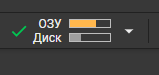



Для предотвращения переполнения ОЗУ может помочь библиотека `gc`. Вставьте строчку `gc.collect()` в цикл ваших экспериментов для сбора и удаления временных данных (кеш).

Перед выполнением задания, пожалуйста, запустите ячейку `Подготовка` ниже:

## Подготовка

### Импорт библиотек

In [1]:
 # Импортируем модели keras: Model
from tensorflow.keras.models import Model

 # Импортируем стандартные слои keras
from tensorflow.keras.layers import Input, Conv2DTranspose, concatenate, Activation
from tensorflow.keras.layers import MaxPooling2D, Conv2D, BatchNormalization, UpSampling2D

# Импортируем оптимизатор Adam
from tensorflow.keras.optimizers import Adam

# Импортируем модуль pyplot библиотеки matplotlib для построения графиков
import matplotlib.pyplot as plt

# Импортируем модуль image для работы с изображениями
from tensorflow.keras.preprocessing import image

# Импортируем библиотеку numpy
import numpy as np

# Импортируем методделения выборки
from sklearn.model_selection import train_test_split

# загрузка файлов по HTML ссылке
import gdown

# Для работы с файлами
import os

# Для генерации случайных чисел
import random

import time

# импортируем модель Image для работы с изображениями
from PIL import Image

# очистка ОЗУ
import gc

### Загрузка датасета

грузим и распаковываем архив картинок

In [2]:
# Загрузка датасета из облака

gdown.download('https://storage.yandexcloud.net/aiueducation/Content/base/l14/construction_256x192.zip', None, quiet=False)
#gdown.download('https://storage.yandexcloud.net/aiueducation/Content/base/l14/construction_512x384.zip', None, quiet=False)

!unzip -q 'construction_256x192.zip' # распоковываем архив

Downloading...
From: https://storage.yandexcloud.net/aiueducation/Content/base/l14/construction_256x192.zip
To: /content/construction_256x192.zip
100%|██████████| 214M/214M [00:22<00:00, 9.44MB/s]


In [3]:
# Глобальные параметры

IMG_WIDTH = 192               # Ширина картинки
IMG_HEIGHT = 256              # Высота картинки
NUM_CLASSES = 16              # Задаем количество классов на изображении
TRAIN_DIRECTORY = 'train'     # Название папки с файлами обучающей выборки
VAL_DIRECTORY = 'val'         # Название папки с файлами проверочной выборки

Загрузим оригинальные изображения (код из лекции):

In [4]:
train_images = [] # Создаем пустой список для хранений оригинальных изображений обучающей выборки
val_images = [] # Создаем пустой список для хранений оригинальных изображений проверочной выборки

cur_time = time.time()  # Засекаем текущее время

# Проходим по всем файлам в каталоге по указанному пути
for filename in sorted(os.listdir(TRAIN_DIRECTORY+'/original')):
    # Читаем очередную картинку и добавляем ее в список изображений с указанным target_size
    train_images.append(image.load_img(os.path.join(TRAIN_DIRECTORY+'/original',filename),
                                       target_size=(IMG_WIDTH, IMG_HEIGHT)))

# Отображаем время загрузки картинок обучающей выборки
print ('Обучающая выборка загружена. Время загрузки: ', round(time.time() - cur_time, 2), 'c', sep='')

# Отображаем количество элементов в обучающей выборке
print ('Количество изображений: ', len(train_images))

cur_time = time.time() # Засекаем текущее время

# Проходим по всем файлам в каталоге по указанному пути
for filename in sorted(os.listdir(VAL_DIRECTORY+'/original')):
    # Читаем очередную картинку и добавляем ее в список изображений с указанным target_size
    val_images.append(image.load_img(os.path.join(VAL_DIRECTORY+'/original',filename),
                                     target_size=(IMG_WIDTH, IMG_HEIGHT)))

# Отображаем время загрузки картинок проверочной выборки
print ('Проверочная выборка загружена. Время загрузки: ', round(time.time() - cur_time, 2), 'c', sep='')

# Отображаем количество элементов в проверочной выборке
print ('Количество изображений: ', len(val_images))

Обучающая выборка загружена. Время загрузки: 0.31c
Количество изображений:  1900
Проверочная выборка загружена. Время загрузки: 0.02c
Количество изображений:  100


Загрузим сегментированные изображения (код из лекции):

In [5]:
train_segments = [] # Создаем пустой список для хранений оригинальных изображений обучающей выборки
val_segments = [] # Создаем пустой список для хранений оригинальных изображений проверочной выборки

cur_time = time.time() # Засекаем текущее время

for filename in sorted(os.listdir(TRAIN_DIRECTORY+'/segment')): # Проходим по всем файлам в каталоге по указанному пути
    # Читаем очередную картинку и добавляем ее в список изображений с указанным target_size
    train_segments.append(image.load_img(os.path.join(TRAIN_DIRECTORY+'/segment',filename),
                                       target_size=(IMG_WIDTH, IMG_HEIGHT)))

# Отображаем время загрузки картинок обучающей выборки
print ('Обучающая выборка загружена. Время загрузки: ', round(time.time() - cur_time, 2), 'c', sep='')

# Отображаем количество элементов в обучающем наборе сегментированных изображений
print ('Количество изображений: ', len(train_segments))

cur_time = time.time() # Засекаем текущее время

for filename in sorted(os.listdir(VAL_DIRECTORY+'/segment')): # Проходим по всем файлам в каталоге по указанному пути
    # Читаем очередную картинку и добавляем ее в список изображений с указанным target_size
    val_segments.append(image.load_img(os.path.join(VAL_DIRECTORY+'/segment',filename),
                                     target_size=(IMG_WIDTH, IMG_HEIGHT)))

# Отображаем время загрузки картинок проверочной выборки
print ('Проверочная выборка загружена. Время загрузки: ', round(time.time() - cur_time, 2), 'c', sep='')

# Отображаем количество элементов в проверочном наборе сегментированных изображений
print ('Количество изображений: ', len(val_segments))

Обучающая выборка загружена. Время загрузки: 0.28c
Количество изображений:  1900
Проверочная выборка загружена. Время загрузки: 0.01c
Количество изображений:  100


## Решение


In [6]:
gc.collect()

30

In [7]:
# Ваше решение

# Служебная функция загрузки выборки изображений из файлов в папке

def load_imageset(folder,   # имя папки
                  subset,   # подмножество изображений - оригинальные или сегментированные
                  title     # имя выборки
                  ):

    # Cписок для хранения изображений выборки
    image_list = []

    # Отметка текущего времени
    cur_time = time.time()

    # Для всех файлов в каталоге по указанному пути:
    for filename in sorted(os.listdir(f'{folder}/{subset}')):

        # Чтение очередной картинки и добавление ее в список изображений требуемого размера
        image_list.append(image.load_img(os.path.join(f'{folder}/{subset}', filename),
                                         target_size=(IMG_WIDTH, IMG_HEIGHT)))

    # Вывод времени загрузки картинок выборки
    print('{} выборка загружена. Время загрузки: {:.2f} с'.format(title,
                                                                  time.time() - cur_time))

    # Вывод количества элементов в выборке
    print('Количество изображений:', len(image_list))

    return image_list


# Функция для просмотра изображений из набора

def show_imageset(image_list,  # выборка изображений
                  n            # количество картинок для просмотра
                  ):

    fig, axs = plt.subplots(1, n, figsize=(25, 10))       # Создание полотна из n графиков

    # Вывод в цикле n случайных изображений
    for i in range(n):
        img = random.choice(image_list)                   # Выборка случайного фото для отображения
        axs[i].axis('off')
        axs[i].imshow(img)                                # Отображение картинки

    plt.show()                                            # Отрисовка изображений

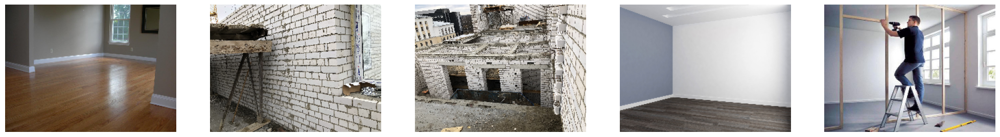

In [8]:
# Просмотр входных изображений из обучающего набора

show_imageset(train_images, 5)

In [9]:
# Загрузка выходных (сегментированных) изображений

train_segments = load_imageset(TRAIN_DIRECTORY, 'segment', 'Обучающая')
val_segments = load_imageset(VAL_DIRECTORY, 'segment', 'Проверочная')

Обучающая выборка загружена. Время загрузки: 0.28 с
Количество изображений: 1900
Проверочная выборка загружена. Время загрузки: 0.02 с
Количество изображений: 100


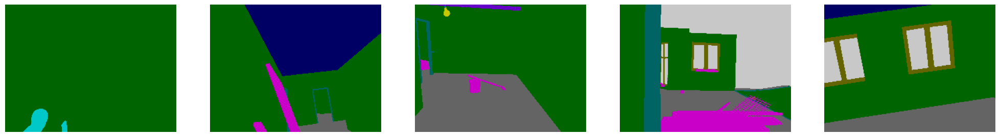

In [10]:
# Просмотр сегментированных изображений из обучающего набора

show_imageset(train_segments, 5)

In [11]:
# Цвета пикселов сегментированных изображений

FLOOR = (100, 100, 100)         # Пол (серый)
CEILING = (0, 0, 100)           # Потолок (синий)
WALL = (0, 100, 0)              # Стена (зеленый)
COLUMN = (100, 0, 0)            # Колонна (красный)
APERTURE = (0, 100, 100)        # Проем (темно-бирюзовый)
DOOR = (100, 0, 100)            # Дверь (бордовый)
WINDOW = (100, 100, 0)          # Окно (золотой)
EXTERNAL = (200, 200, 200)      # Внешний мир (светло-серый)
RAILINGS = (0, 200, 0)          # Перила (светло-зеленый)
BATTERY = (200, 0, 0)           # Батареи (светло-красный)
PEOPLE = (0, 200, 200)          # Люди (бирюзовый)
LADDER = (0, 0, 200)            # Лестница (светло-синий)
INVENTORY = (200, 0, 200)       # Инвентарь (розовый)
LAMP = (200, 200, 0)            # Лампа (желтый)
WIRE = (0, 100, 200)            # Провод (голубой)
BEAM = (100, 0, 200)            # Балка (фиолетовый)

# Объединим все в один список меток классов

CLASS_LABELS = (FLOOR, CEILING, WALL, COLUMN, APERTURE, DOOR, WINDOW, EXTERNAL, RAILINGS, BATTERY, PEOPLE, LADDER, INVENTORY, LAMP, WIRE, BEAM)

# Посчитаем количество классов

CLASS_COUNT = len(CLASS_LABELS)

In [12]:
# Функция преобразования цветного сегментированного изображения в метки классов

def rgb_to_labels(image_list  # список цветных изображений
                 ):

    result = []

    # Для всех картинок в списке:
    for d in image_list:
        sample = np.array(d)
        # Создание пустой 1-канальной картики
        y = np.zeros((IMG_WIDTH, IMG_HEIGHT, 1), dtype='uint8')

        # По всем классам:
        for i, cl in enumerate(CLASS_LABELS):
            # Нахождение 3-х канальных пикселей классов и занесение метки класса
            y[np.where(np.all(sample == CLASS_LABELS[i], axis=-1))] = i

        result.append(y)

    return np.array(result)

# Функция преобразования тензора меток класса в цветное сегметрированное изображение

def labels_to_rgb(image_list  # список одноканальных изображений
                 ):

    result = []

    # Для всех картинок в списке:
    for y in image_list:
        # Создание пустой цветной картики
        temp = np.zeros((IMG_WIDTH, IMG_HEIGHT, 3), dtype='uint8')

        # По всем классам:
        for i, cl in enumerate(CLASS_LABELS):
            # Нахождение пикселов класса и заполнение цветом из CLASS_LABELS[i]
            temp[np.where(np.all(y==i, axis=-1))] = CLASS_LABELS[i]

        result.append(temp)

    return np.array(result)

In [13]:
# Формирование обучающей выборки

x_train = []                          # Cписок под обучающую выборку

for img in train_images:              # Для всех изображений выборки:
    x = image.img_to_array(img)       # Перевод изображения в numpy-массив формы: высота x ширина x количество каналов
    x_train.append(x)                 # Добавление элемента в x_train

x_train = np.array(x_train)           # Перевод всей выборки в numpy
print(x_train.shape)                  # Форма x_train

(1900, 192, 256, 3)


In [14]:
# Формирование проверочной выборки

x_val = []                            # Cписок под проверочную выборку

for img in val_images:                # Для всех изображений выборки:
    x = image.img_to_array(img)       # Перевод изображения в numpy-массив формы: высота x ширина x количество каналов
    x_val.append(x)                   # Добавление элемента в x_train

x_val = np.array(x_val)               # Перевод всей выборки в numpy
print(x_val.shape)                    # Форма x_train

(100, 192, 256, 3)


In [15]:
# Преобразование сегментов в метки классов

y_train = rgb_to_labels(train_segments)
y_val = rgb_to_labels(val_segments)

print(y_train.shape)
print(y_val.shape)

(1900, 192, 256, 1)
(100, 192, 256, 1)


In [ ]:
# Модель нейронной сети

def sequential_segmentation_net(class_count,  # количество классов
                                input_shape   # форма входного изображения
                                ):

    img_input = Input(input_shape)                                              # Создаем входной слой формой input_shape
    x = Conv2D(128, (3, 3), padding='same', name='block1_conv1')(img_input)     # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(64, (3, 3), padding='same', name='block1_conv3')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                                   # Добавляем слой Activation

    x = Conv2D(32, (3, 3), padding='same', name='block1_conv4')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(16, (3, 3), padding='same', name='block1_conv5')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(class_count, (3, 3), activation='softmax', padding='same')(x)    # Добавляем Conv2D-Слой с softmax-активацией на class_count-нейронов

    model = Model(img_input, x)                                                 # Создаем модель с входом 'img_input' и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='sparse_categorical_crossentropy',
                  metrics=['sparse_categorical_accuracy'])

    # Возвращаем сформированную модель
    return model

In [ ]:
# Создание модели и вывод сводки по архитектуре

model_seq = sequential_segmentation_net(CLASS_COUNT,
                                       (IMG_WIDTH, IMG_HEIGHT, 3))

model_seq.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 192, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 192, 256, 128)       │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 192, 256, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 192, 256, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv3 (Conv2D)                │ (None, 192, 256, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 192, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 192, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv4 (Conv2D)                │ (None, 192, 256, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 192, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 192, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv5 (Conv2D)                │ (None, 192, 256, 16)        │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 192, 256, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 192, 256, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 192, 256, 16)        │           2,320 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 103,744 (405.25 KB)

 Trainable params: 103,264 (403.38 KB)

 Non-trainable params: 480 (1.88 KB)

In [16]:
# Дополнительные утилиты keras
from tensorflow.keras import utils

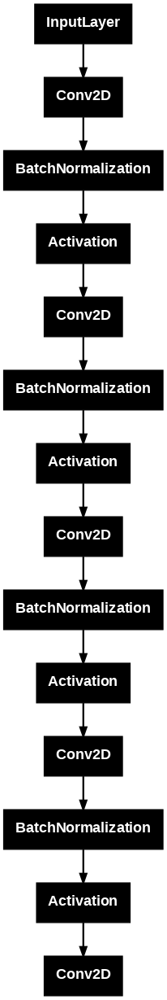

In [ ]:
utils.plot_model(model_seq, dpi=80)

In [ ]:
# Обучение модели на 10 эпохах

history = model_seq.fit(x_train, y_train,
                        epochs=10, batch_size=12,
                        validation_data=(x_val, y_val))

Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 1.9592 - sparse_categorical_accuracy: 0.3884 - val_loss: 2.3392 - val_sparse_categorical_accuracy: 0.3520
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 1.3999 - sparse_categorical_accuracy: 0.5471 - val_loss: 2.1756 - val_sparse_categorical_accuracy: 0.2441
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 1.3131 - sparse_categorical_accuracy: 0.5693 - val_loss: 1.9382 - val_sparse_categorical_accuracy: 0.3926
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - loss: 1.2518 - sparse_categorical_accuracy: 0.5877 - val_loss: 2.0991 - val_sparse_categorical_accuracy: 0.3253
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 1.2440 - sparse_categorical_accuracy: 0.5944 - val_loss: 2.0020 - val_sparse_categorical_accuracy: 0.4490
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 1.2154 - sparse_categorical_accuracy: 0.6022 - val_loss: 1.8010 - val_sparse_categorical_acc

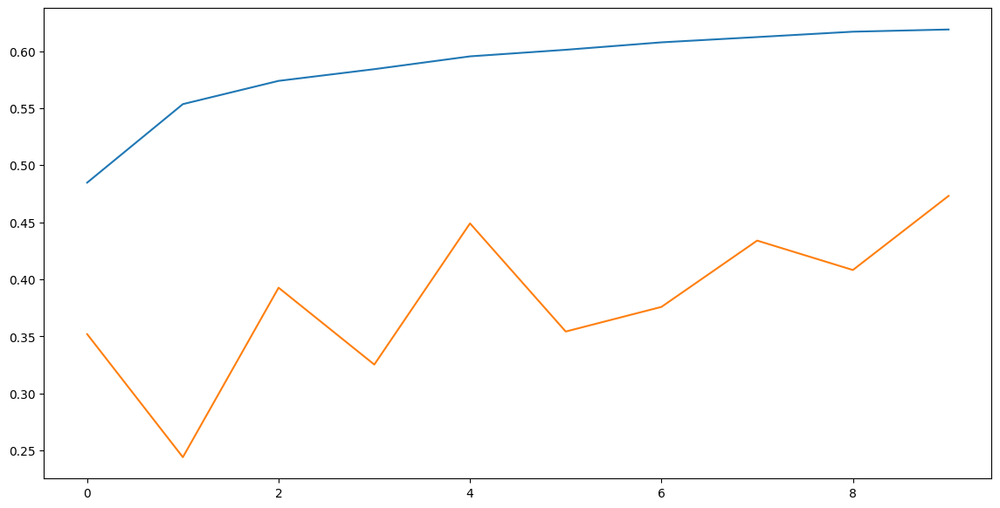

In [ ]:
# Отображение графиков обучения модели

plt.figure(figsize=(14, 7))
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.show()

In [42]:
# Функция визуализации процесса сегментации изображений

def process_images(model,        # обученная модель
                   count = 1     # количество случайных картинок для сегментации
                   ):

    # Генерация случайного списка индексов в количестве count между (0, len(x_val)
    indexes = np.random.randint(0, len(x_val), count)

    # Вычисление предсказания сети для картинок с отобранными индексами
    predict = np.argmax(model.predict(x_val[indexes]), axis=-1)

    # Подготовка цветов классов для отрисовки предсказания
    orig = labels_to_rgb(predict[..., None])
    fig, axs = plt.subplots(3, count, figsize=(25, 15))

    # Отрисовка результата работы модели
    for i in range(count):
        # Отображение на графике в первой линии предсказания модели
        axs[0, 0].set_title('Результат работы модели:')
        axs[0, i].imshow(orig[i])
        axs[0, i].axis('off')

        # Отображение на графике во второй линии сегментированного изображения из y_val
        axs[1, 0].set_title('Оригинальное сегментированное')
        axs[1, i].imshow(val_segments[indexes[i]])
        axs[1 ,i].axis('off')

        # Отображение на графике в третьей линии оригинального изображения
        axs[2, 0].set_title('Оригинальное изображение')
        axs[2, i].imshow(val_images[indexes[i]])
        axs[2 ,i].axis('off')

    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


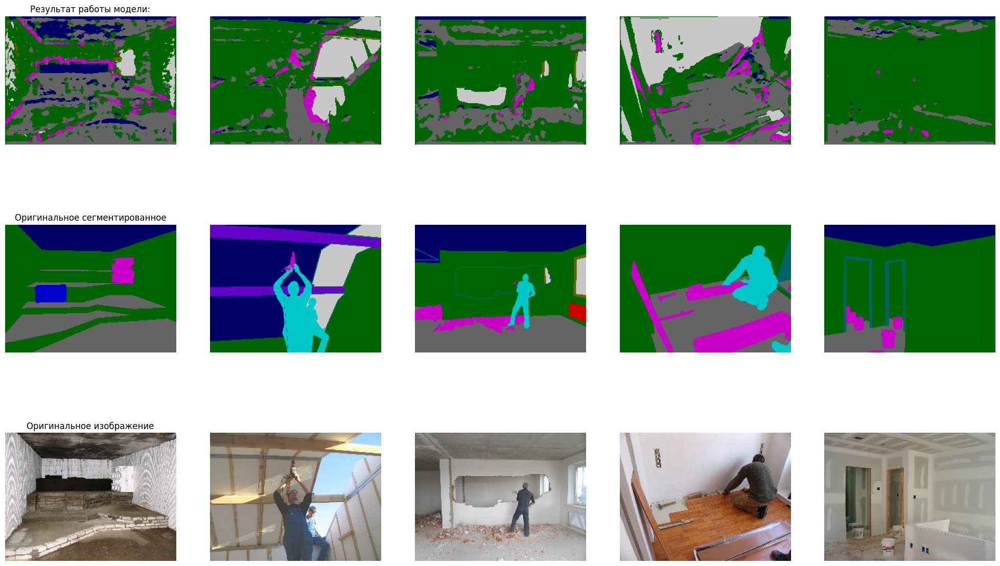

In [ ]:
# Отображение результатов работы модели

process_images(model_seq, 5)

In [17]:
# Вычисление количества пикселов по всем классам в y_train

pix_count = np.zeros(CLASS_COUNT)
for i in range(CLASS_COUNT):
    pix_count[i] = (y_train == i).sum()

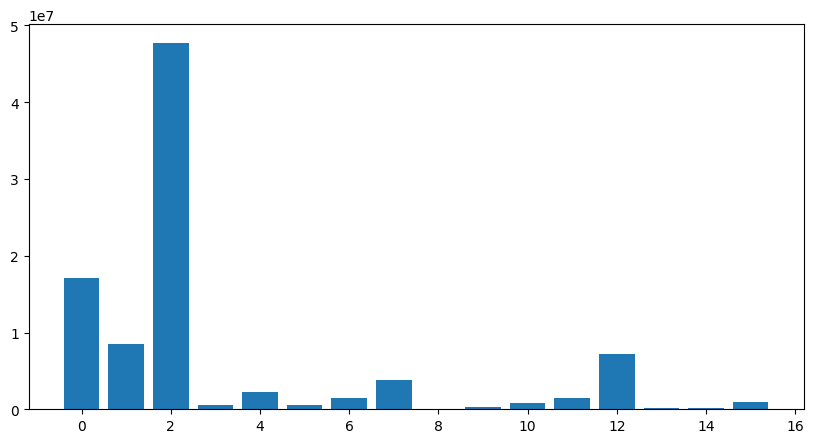

In [18]:
# Отрисовка столбчатой диаграммы наполненности классов

plt.figure(figsize = (10, 5))
plt.bar(np.arange(CLASS_COUNT), pix_count)
plt.show()

Попробуем создать модель для сегментации на 5 классов:

Стены;
Пол;
Потолок;
Инвентарь;
Остальное.

In [19]:
y_train5 = y_train.copy()
y_train5[(y_train5 > 2) & (y_train5 != 12)] = 3
y_train5[y_train5 == 12] = 4

y_val5 = y_val.copy()
y_val5[(y_val5 > 2) & (y_val5 != 12)] = 3
y_val5[y_val5 == 12] = 4

In [ ]:
# Создание модели для уменьшенного набора классов

model_seq5 = sequential_segmentation_net(5,
                                        (IMG_WIDTH, IMG_HEIGHT, 3))
model_seq5.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 192, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 192, 256, 128)       │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 192, 256, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 192, 256, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv3 (Conv2D)                │ (None, 192, 256, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 192, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_5 (Activation)            │ (None, 192, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv4 (Conv2D)                │ (None, 192, 256, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 192, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_6 (Activation)            │ (None, 192, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv5 (Conv2D)                │ (None, 192, 256, 16)        │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 192, 256, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_7 (Activation)            │ (None, 192, 256, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 192, 256, 5)         │             725 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 102,149 (399.02 KB)

 Trainable params: 101,669 (397.14 KB)

 Non-trainable params: 480 (1.88 KB)

In [ ]:
# Обучение модели на 10-ти эпохах

history = model_seq5.fit(x_train, y_train5,
                         epochs=10, batch_size=12,
                         validation_data=(x_val, y_val5))

Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 1.3043 - sparse_categorical_accuracy: 0.4915 - val_loss: 2.4209 - val_sparse_categorical_accuracy: 0.0912
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 32s 120ms/step - loss: 1.1442 - sparse_categorical_accuracy: 0.5520 - val_loss: 1.6340 - val_sparse_categorical_accuracy: 0.4059
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 1.0808 - sparse_categorical_accuracy: 0.5831 - val_loss: 1.4784 - val_sparse_categorical_accuracy: 0.3603
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 1.0502 - sparse_categorical_accuracy: 0.5959 - val_loss: 1.4761 - val_sparse_categorical_accuracy: 0.3390
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 1.0297 - sparse_categorical_accuracy: 0.6055 - val_loss: 1.3940 - val_sparse_categorical_accuracy: 0.4371
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 0.9976 - sparse_categorical_accuracy: 0.6177 - val_loss: 1.4664 - val_sparse_categorical_acc

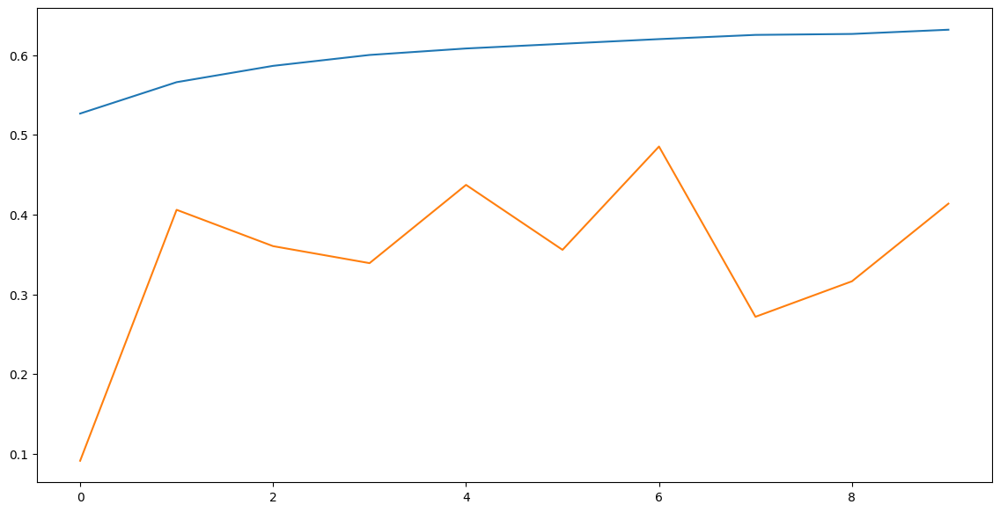

In [ ]:
# Отображение графиков обучения модели

plt.figure(figsize=(14, 7))
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 637ms/step


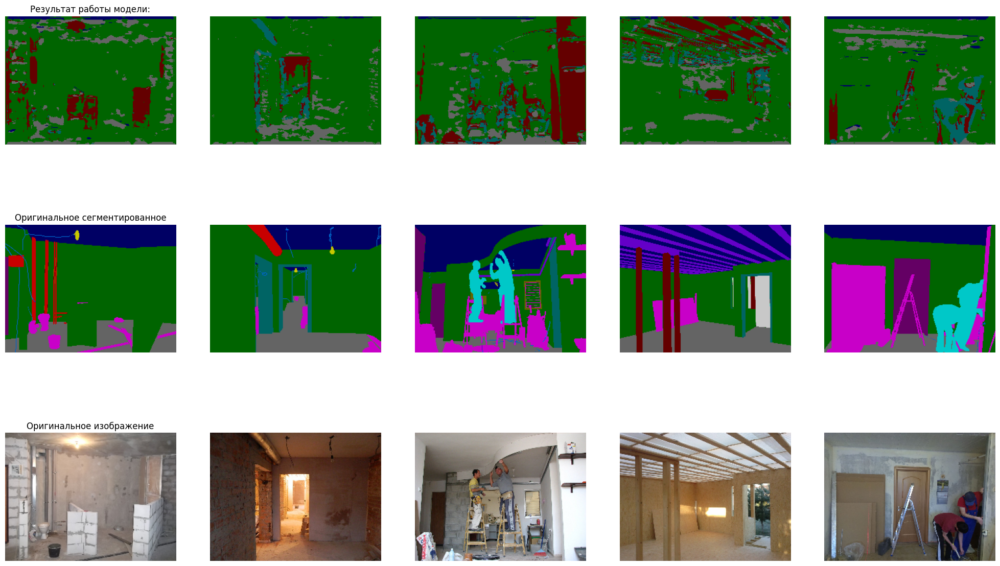

In [ ]:
# Отображение результатов работы модели

process_images(model_seq5, 5)

Результат немного улучшился, но недостаточно. Попробуем создать модель с другими параметрами

In [ ]:
# Модель нейронной сети с уменьшеным числом фильтров

def sequential_segmentation_net(class_count,  # количество классов
                                input_shape   # форма входного изображения
                                ):

    img_input = Input(input_shape)                                              # Создаем входной слой формой input_shape
    x = Conv2D(64, (3, 3), padding='same', name='block1_conv1')(img_input)      # Добавляем Conv2D-слой с 64-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(32, (3, 3), padding='same', name='block1_conv3')(x)              # Добавляем Conv2D-слой с 32-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                                   # Добавляем слой Activation

    x = Conv2D(16, (3, 3), padding='same', name='block1_conv4')(x)              # Добавляем Conv2D-слой с 16-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(8, (3, 3), padding='same', name='block1_conv5')(x)               # Добавляем Conv2D-слой с 8-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(class_count, (3, 3), activation='softmax', padding='same')(x)    # Добавляем Conv2D-Слой с softmax-активацией на class_count-нейронов

    model = Model(img_input, x)                                                 # Создаем модель с входом 'img_input' и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='sparse_categorical_crossentropy',
                  metrics=['sparse_categorical_accuracy'])

    # Возвращаем сформированную модель
    return model

In [ ]:
# Создание модели для уменьшенного числа фильтров

model_seq5 = sequential_segmentation_net(5,
                                        (IMG_WIDTH, IMG_HEIGHT, 3))
model_seq5.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 192, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 192, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 192, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_8 (Activation)            │ (None, 192, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv3 (Conv2D)                │ (None, 192, 256, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 192, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_9 (Activation)            │ (None, 192, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv4 (Conv2D)                │ (None, 192, 256, 16)        │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 192, 256, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_10 (Activation)           │ (None, 192, 256, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv5 (Conv2D)                │ (None, 192, 256, 8)         │           1,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 192, 256, 8)         │              32 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_11 (Activation)           │ (None, 192, 256, 8)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 192, 256, 5)         │             365 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,885 (105.02 KB)

 Trainable params: 26,645 (104.08 KB)

 Non-trainable params: 240 (960.00 B)

In [ ]:
# Обучение модели на 10-ти эпохах

history = model_seq5.fit(x_train, y_train5,
                         epochs=10, batch_size=12,
                         validation_data=(x_val, y_val5))

Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 24s 106ms/step - loss: 1.3782 - sparse_categorical_accuracy: 0.4586 - val_loss: 1.7891 - val_sparse_categorical_accuracy: 0.4484
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step - loss: 1.1709 - sparse_categorical_accuracy: 0.5474 - val_loss: 1.4343 - val_sparse_categorical_accuracy: 0.4295
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 1.1328 - sparse_categorical_accuracy: 0.5644 - val_loss: 1.5733 - val_sparse_categorical_accuracy: 0.4377
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - loss: 1.1095 - sparse_categorical_accuracy: 0.5716 - val_loss: 1.3595 - val_sparse_categorical_accuracy: 0.4441
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - loss: 1.0792 - sparse_categorical_accuracy: 0.5839 - val_loss: 1.3692 - val_sparse_categorical_accuracy: 0.4307
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step - loss: 1.0528 - sparse_categorical_accuracy: 0.5953 - val_loss: 1.5506 - val_sparse_categorical_accuracy:

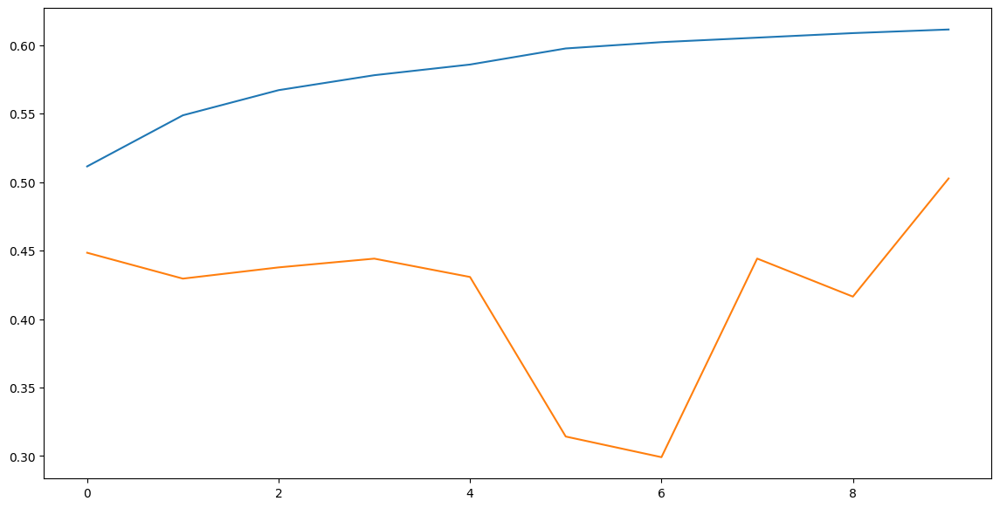

In [ ]:
# Отображение графиков обучения модели

plt.figure(figsize=(14, 7))
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


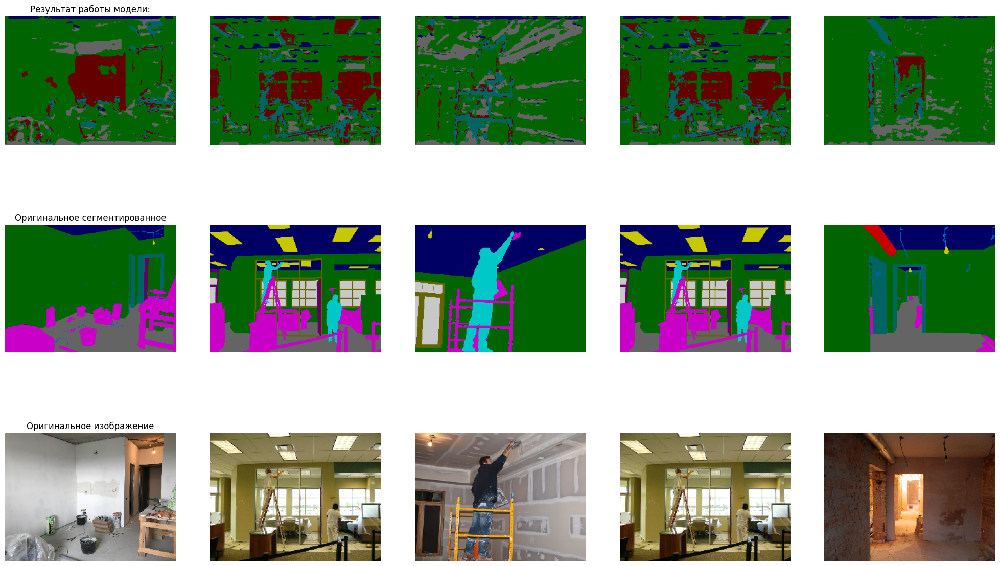

In [ ]:
# Отображение результатов работы модели

process_images(model_seq5, 5)

Результат так себе. Попробуем увеличить число фильтров.

In [ ]:
# Модель нейронной сети с уменьшеным числом фильтров

def sequential_segmentation_net(class_count,  # количество классов
                                input_shape   # форма входного изображения
                                ):

    img_input = Input(input_shape)                                              # Создаем входной слой формой input_shape
    x = Conv2D(256, (3, 3), padding='same', name='block1_conv1')(img_input)     # Добавляем Conv2D-слой с 256-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(128, (3, 3), padding='same', name='block1_conv3')(x)             # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                                   # Добавляем слой Activation

    x = Conv2D(64, (3, 3), padding='same', name='block1_conv4')(x)              # Добавляем Conv2D-слой с 64-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(32, (3, 3), padding='same', name='block1_conv5')(x)              # Добавляем Conv2D-слой с 32-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(class_count, (3, 3), activation='softmax', padding='same')(x)    # Добавляем Conv2D-Слой с softmax-активацией на class_count-нейронов

    model = Model(img_input, x)                                                 # Создаем модель с входом 'img_input' и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='sparse_categorical_crossentropy',
                  metrics=['sparse_categorical_accuracy'])

    # Возвращаем сформированную модель
    return model

In [ ]:
# Создание модели для увеличенного числа фильтров

model_seq5 = sequential_segmentation_net(5,
                                        (IMG_WIDTH, IMG_HEIGHT, 3))
model_seq5.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 192, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 192, 256, 256)       │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 192, 256, 256)       │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_12 (Activation)           │ (None, 192, 256, 256)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv3 (Conv2D)                │ (None, 192, 256, 128)       │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 192, 256, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_13 (Activation)           │ (None, 192, 256, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv4 (Conv2D)                │ (None, 192, 256, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 192, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_14 (Activation)           │ (None, 192, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv5 (Conv2D)                │ (None, 192, 256, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 192, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_15 (Activation)           │ (None, 192, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 192, 256, 5)         │           1,445 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 397,829 (1.52 MB)

 Trainable params: 396,869 (1.51 MB)

 Non-trainable params: 960 (3.75 KB)

In [ ]:
# Обучение модели на 10-ти эпохах

history = model_seq5.fit(x_train, y_train5,
                         epochs=10, batch_size=12,
                         validation_data=(x_val, y_val5))

Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 81s 379ms/step - loss: 1.3087 - sparse_categorical_accuracy: 0.4979 - val_loss: 3.1198 - val_sparse_categorical_accuracy: 0.1277
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 54s 314ms/step - loss: 1.1412 - sparse_categorical_accuracy: 0.5591 - val_loss: 1.8799 - val_sparse_categorical_accuracy: 0.1571
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 82s 316ms/step - loss: 1.0796 - sparse_categorical_accuracy: 0.5856 - val_loss: 1.6461 - val_sparse_categorical_accuracy: 0.3472
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 81s 313ms/step - loss: 1.0426 - sparse_categorical_accuracy: 0.6037 - val_loss: 1.5705 - val_sparse_categorical_accuracy: 0.3667
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 82s 314ms/step - loss: 1.0312 - sparse_categorical_accuracy: 0.6051 - val_loss: 1.4466 - val_sparse_categorical_accuracy: 0.4057
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 49s 311ms/step - loss: 1.0039 - sparse_categorical_accuracy: 0.6163 - val_loss: 1.4672 - val_sparse_categorical_acc

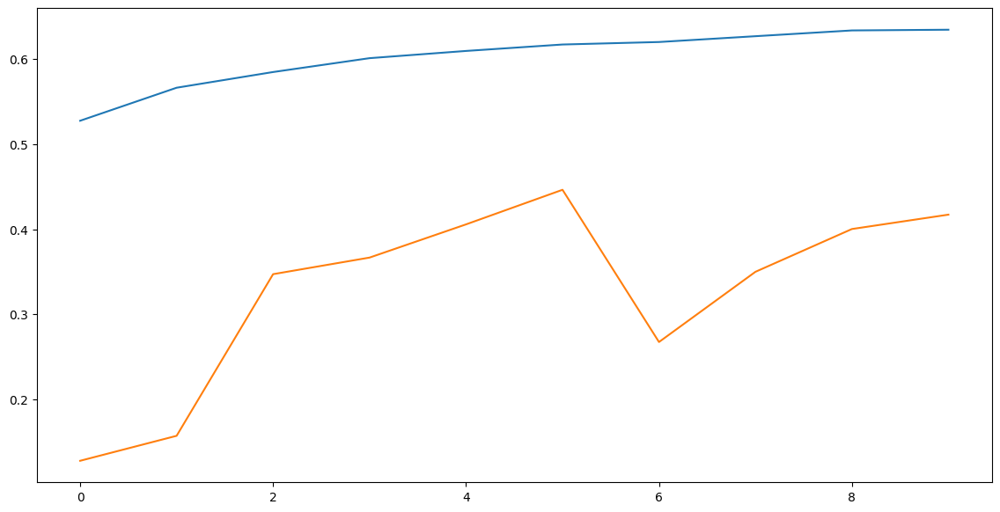

In [ ]:
# Отображение графиков обучения модели

plt.figure(figsize=(14, 7))
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


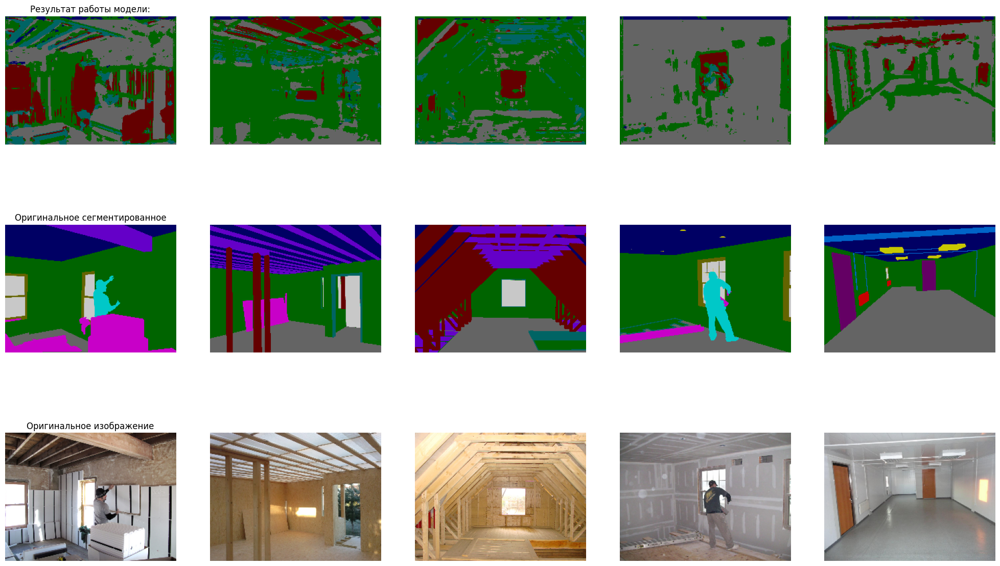

In [ ]:
process_images(model_seq5, 5)

Результат примерно как у изначальной модели. Возьмем изначальную модель дня дальнейших экспериментов.

In [ ]:
# Модель нейронной сети с увеличенным ядром

def sequential_segmentation_net(class_count,  # количество классов
                                input_shape   # форма входного изображения
                                ):

    img_input = Input(input_shape)                                              # Создаем входной слой формой input_shape
    x = Conv2D(128, (5, 5), padding='same', name='block1_conv1')(img_input)     # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(64, (5, 5), padding='same', name='block1_conv3')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                                   # Добавляем слой Activation

    x = Conv2D(32, (5, 5), padding='same', name='block1_conv4')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(16, (5, 5), padding='same', name='block1_conv5')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(class_count, (5, 5), activation='softmax', padding='same')(x)    # Добавляем Conv2D-Слой с softmax-активацией на class_count-нейронов

    model = Model(img_input, x)                                                 # Создаем модель с входом 'img_input' и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='sparse_categorical_crossentropy',
                  metrics=['sparse_categorical_accuracy'])

    # Возвращаем сформированную модель
    return model

In [ ]:
# Создание модели для увеличенного ядра

model_seq5 = sequential_segmentation_net(5,
                                        (IMG_WIDTH, IMG_HEIGHT, 3))
model_seq5.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 192, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 192, 256, 128)       │           9,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 192, 256, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_16 (Activation)           │ (None, 192, 256, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv3 (Conv2D)                │ (None, 192, 256, 64)        │         204,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_17               │ (None, 192, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_17 (Activation)           │ (None, 192, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv4 (Conv2D)                │ (None, 192, 256, 32)        │          51,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_18               │ (None, 192, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_18 (Activation)           │ (None, 192, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv5 (Conv2D)                │ (None, 192, 256, 16)        │          12,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_19               │ (None, 192, 256, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_19 (Activation)           │ (None, 192, 256, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 192, 256, 5)         │           2,005 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 281,605 (1.07 MB)

 Trainable params: 281,125 (1.07 MB)

 Non-trainable params: 480 (1.88 KB)

In [ ]:
# Обучение модели на 10-ти эпохах

history = model_seq5.fit(x_train, y_train5,
                         epochs=10, batch_size=12,
                         validation_data=(x_val, y_val5))

Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 69s 293ms/step - loss: 1.3000 - sparse_categorical_accuracy: 0.4964 - val_loss: 5.1787 - val_sparse_categorical_accuracy: 0.1345
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 51s 224ms/step - loss: 1.1513 - sparse_categorical_accuracy: 0.5513 - val_loss: 2.2019 - val_sparse_categorical_accuracy: 0.2472
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 41s 226ms/step - loss: 1.1007 - sparse_categorical_accuracy: 0.5716 - val_loss: 1.7842 - val_sparse_categorical_accuracy: 0.4650
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 41s 229ms/step - loss: 1.0525 - sparse_categorical_accuracy: 0.5937 - val_loss: 1.5181 - val_sparse_categorical_accuracy: 0.3834
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 41s 226ms/step - loss: 1.0142 - sparse_categorical_accuracy: 0.6061 - val_loss: 2.0242 - val_sparse_categorical_accuracy: 0.2878
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 41s 226ms/step - loss: 1.0050 - sparse_categorical_accuracy: 0.6095 - val_loss: 1.7334 - val_sparse_categorical_acc

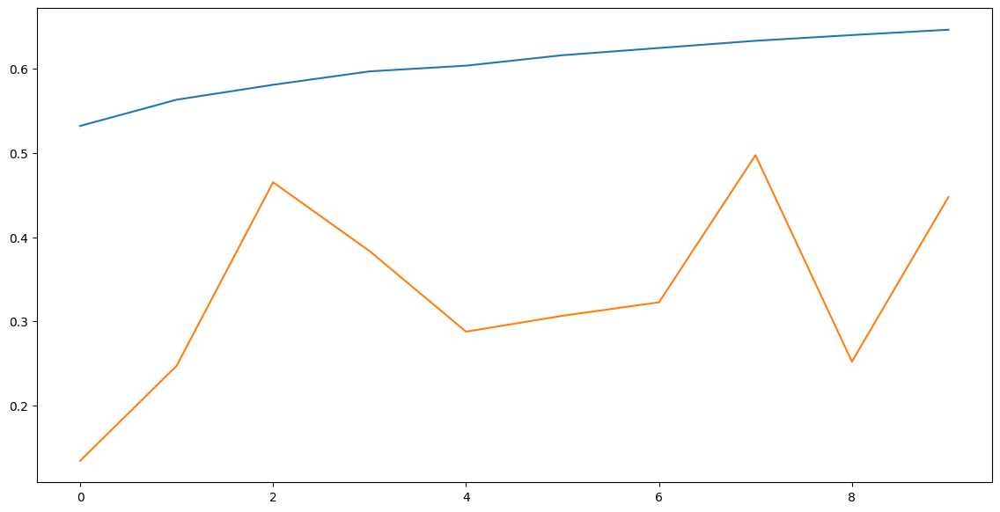

In [ ]:
# Отображение графиков обучения модели

plt.figure(figsize=(14, 7))
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


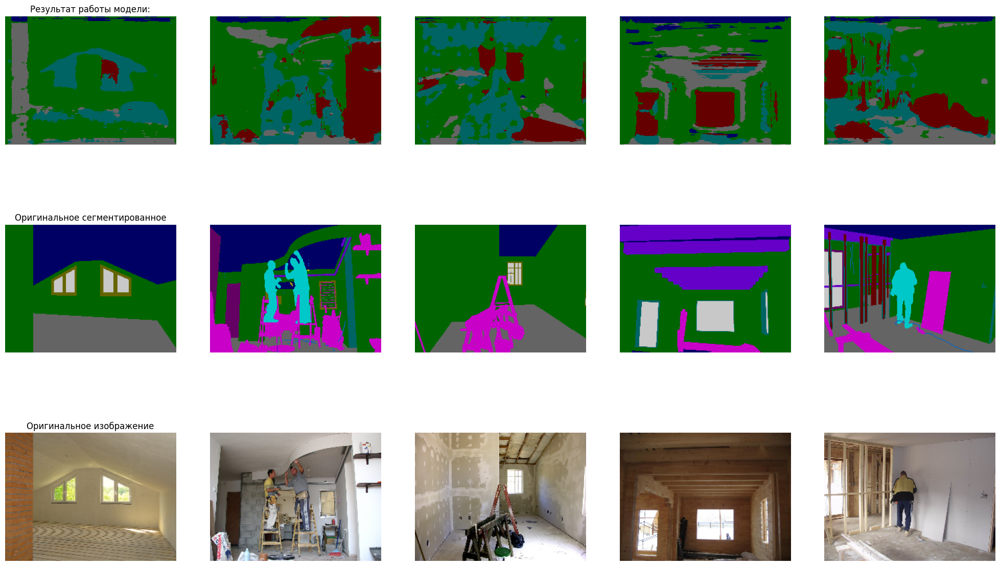

In [ ]:
process_images(model_seq5, 5)

Попробуем уменьшить ядро

In [ ]:
# Модель нейронной сети с уменьшенным ядром

def sequential_segmentation_net(class_count,  # количество классов
                                input_shape   # форма входного изображения
                                ):

    img_input = Input(input_shape)                                              # Создаем входной слой формой input_shape
    x = Conv2D(128, (1, 1), padding='same', name='block1_conv1')(img_input)     # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(64, (1, 1), padding='same', name='block1_conv3')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)                                                   # Добавляем слой Activation

    x = Conv2D(32, (1, 1), padding='same', name='block1_conv4')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(16, (1, 1), padding='same', name='block1_conv5')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('relu')(x)

    x = Conv2D(class_count, (1, 1), activation='softmax', padding='same')(x)    # Добавляем Conv2D-Слой с softmax-активацией на class_count-нейронов

    model = Model(img_input, x)                                                 # Создаем модель с входом 'img_input' и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='sparse_categorical_crossentropy',
                  metrics=['sparse_categorical_accuracy'])

    # Возвращаем сформированную модель
    return model

In [ ]:
# Создание модели для уменьшенного ядра

model_seq5 = sequential_segmentation_net(5,
                                        (IMG_WIDTH, IMG_HEIGHT, 3))
model_seq5.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 192, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 192, 256, 128)       │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_20               │ (None, 192, 256, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_20 (Activation)           │ (None, 192, 256, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv3 (Conv2D)                │ (None, 192, 256, 64)        │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_21               │ (None, 192, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_21 (Activation)           │ (None, 192, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv4 (Conv2D)                │ (None, 192, 256, 32)        │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_22               │ (None, 192, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_22 (Activation)           │ (None, 192, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv5 (Conv2D)                │ (None, 192, 256, 16)        │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_23               │ (None, 192, 256, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_23 (Activation)           │ (None, 192, 256, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 192, 256, 5)         │              85 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,421 (48.52 KB)

 Trainable params: 11,941 (46.64 KB)

 Non-trainable params: 480 (1.88 KB)

In [ ]:
# Обучение модели на 10-ти эпохах

history = model_seq5.fit(x_train, y_train5,
                         epochs=10, batch_size=12,
                         validation_data=(x_val, y_val5))

Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - loss: 1.4753 - sparse_categorical_accuracy: 0.4767 - val_loss: 1.5201 - val_sparse_categorical_accuracy: 0.3958
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 27s 55ms/step - loss: 1.2825 - sparse_categorical_accuracy: 0.5283 - val_loss: 1.4656 - val_sparse_categorical_accuracy: 0.4366
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step - loss: 1.2613 - sparse_categorical_accuracy: 0.5370 - val_loss: 1.4429 - val_sparse_categorical_accuracy: 0.4391
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - loss: 1.2512 - sparse_categorical_accuracy: 0.5387 - val_loss: 1.4211 - val_sparse_categorical_accuracy: 0.4641
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step - loss: 1.2513 - sparse_categorical_accuracy: 0.5393 - val_loss: 1.4361 - val_sparse_categorical_accuracy: 0.4509
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 9s 56ms/step - loss: 1.2646 - sparse_categorical_accuracy: 0.5329 - val_loss: 1.4486 - val_sparse_categorical_accuracy: 0

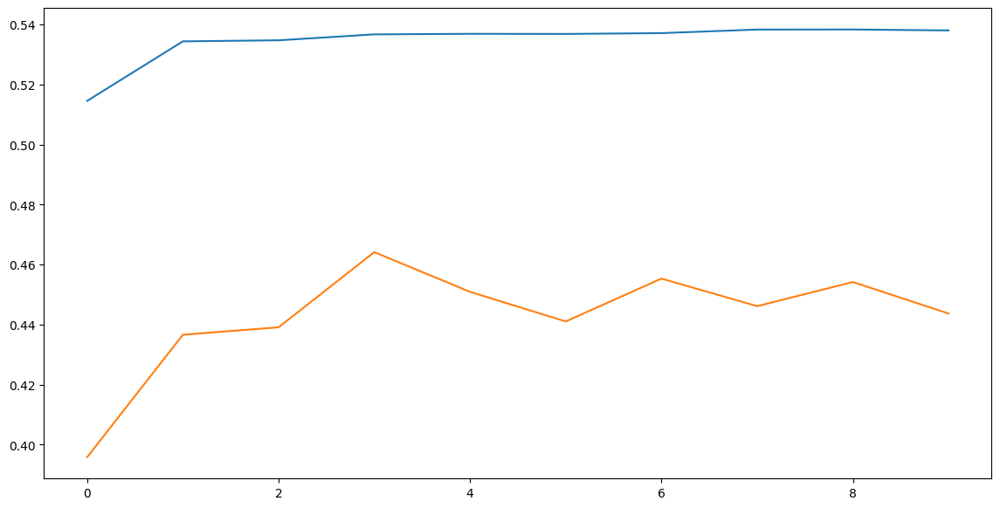

In [ ]:
# Отображение графиков обучения модели

plt.figure(figsize=(14, 7))
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 982ms/step


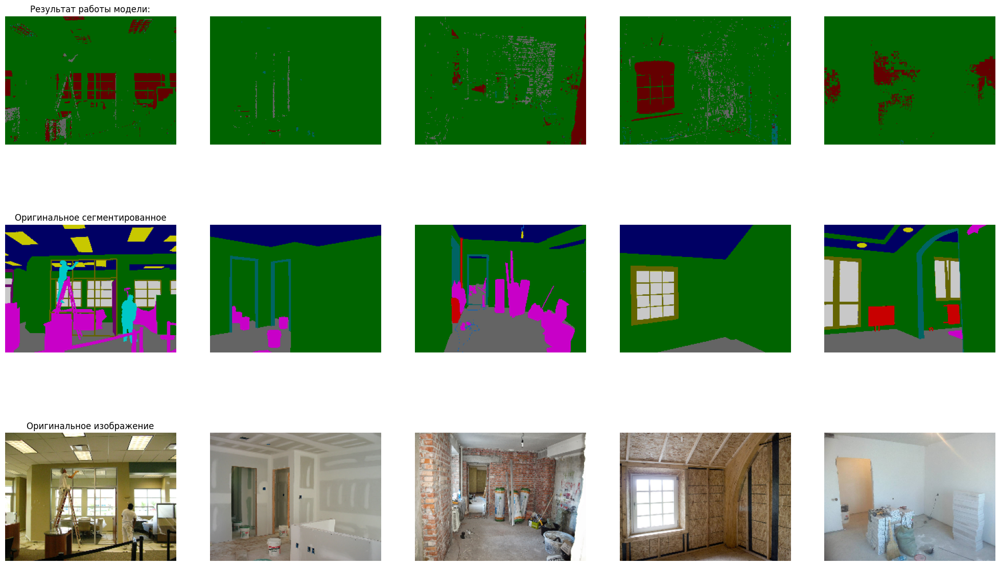

In [ ]:
process_images(model_seq5, 5)

Результат так себе, но выигрывыет по ресурсам. Для экспериментов с функцией активации возьмем с ядром (3,3)

In [ ]:
# Модель нейронной сети с функцией активации linear

def sequential_segmentation_net(class_count,  # количество классов
                                input_shape   # форма входного изображения
                                ):

    img_input = Input(input_shape)                                              # Создаем входной слой формой input_shape
    x = Conv2D(128, (3, 3), padding='same', name='block1_conv1')(img_input)     # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('linear')(x)

    x = Conv2D(64, (3, 3), padding='same', name='block1_conv3')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('linear')(x)                                                   # Добавляем слой Activation

    x = Conv2D(32, (3, 3), padding='same', name='block1_conv4')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('linear')(x)

    x = Conv2D(16, (3, 3), padding='same', name='block1_conv5')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('linear')(x)

    x = Conv2D(class_count, (3, 3), activation='softmax', padding='same')(x)    # Добавляем Conv2D-Слой с softmax-активацией на class_count-нейронов

    model = Model(img_input, x)                                                 # Создаем модель с входом 'img_input' и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='sparse_categorical_crossentropy',
                  metrics=['sparse_categorical_accuracy'])

    # Возвращаем сформированную модель
    return model

In [ ]:
# Создание модели для измененной функции активации linear

model_seq5 = sequential_segmentation_net(5,
                                        (IMG_WIDTH, IMG_HEIGHT, 3))
model_seq5.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)           │ (None, 192, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 192, 256, 128)       │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_24               │ (None, 192, 256, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_24 (Activation)           │ (None, 192, 256, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv3 (Conv2D)                │ (None, 192, 256, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_25               │ (None, 192, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_25 (Activation)           │ (None, 192, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv4 (Conv2D)                │ (None, 192, 256, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_26               │ (None, 192, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_26 (Activation)           │ (None, 192, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv5 (Conv2D)                │ (None, 192, 256, 16)        │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_27               │ (None, 192, 256, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_27 (Activation)           │ (None, 192, 256, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 192, 256, 5)         │             725 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 102,149 (399.02 KB)

 Trainable params: 101,669 (397.14 KB)

 Non-trainable params: 480 (1.88 KB)

In [ ]:
# Обучение модели на 10-ти эпохах

history = model_seq5.fit(x_train, y_train5,
                         epochs=10, batch_size=12,
                         validation_data=(x_val, y_val5))

Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 1.5757 - sparse_categorical_accuracy: 0.3354 - val_loss: 1.5702 - val_sparse_categorical_accuracy: 0.3755
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 1.3065 - sparse_categorical_accuracy: 0.5203 - val_loss: 1.4503 - val_sparse_categorical_accuracy: 0.4576
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 20s 126ms/step - loss: 1.2882 - sparse_categorical_accuracy: 0.5292 - val_loss: 1.4480 - val_sparse_categorical_accuracy: 0.4700
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 1.2800 - sparse_categorical_accuracy: 0.5370 - val_loss: 1.4570 - val_sparse_categorical_accuracy: 0.4613
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 21s 125ms/step - loss: 1.2930 - sparse_categorical_accuracy: 0.5250 - val_loss: 1.4335 - val_sparse_categorical_accuracy: 0.4721
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 20s 124ms/step - loss: 1.2898 - sparse_categorical_accuracy: 0.5293 - val_loss: 1.4454 - val_sparse_categorical_acc

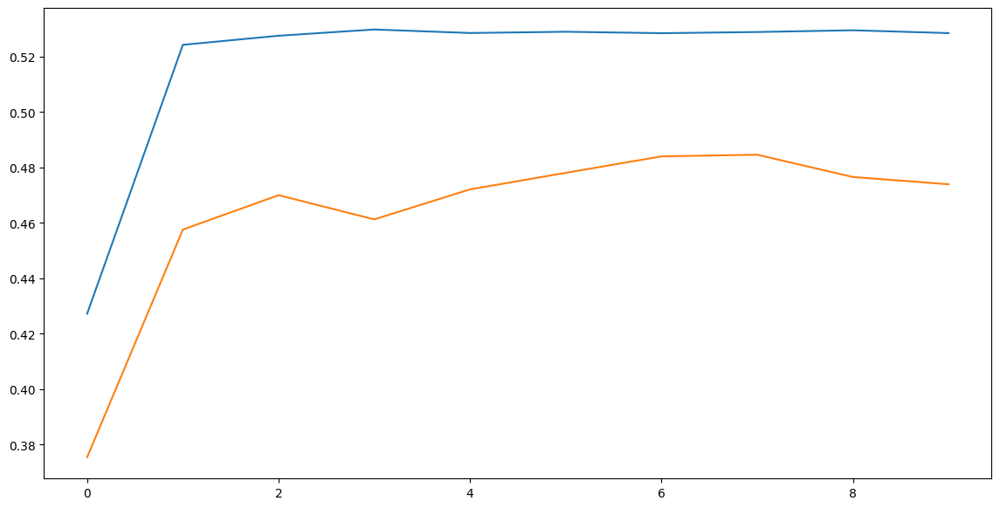

In [ ]:
# Отображение графиков обучения модели

plt.figure(figsize=(14, 7))
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


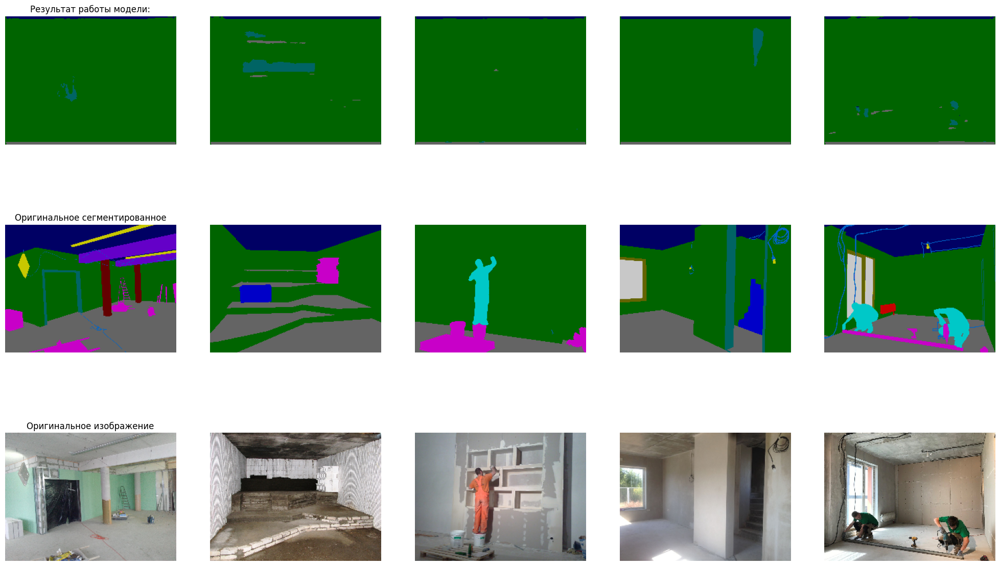

In [ ]:
process_images(model_seq5, 5)

Графики нелохи, но результат заметно хуже.

In [ ]:
# Модель нейронной сети с функцией активации selu

def sequential_segmentation_net(class_count,  # количество классов
                                input_shape   # форма входного изображения
                                ):

    img_input = Input(input_shape)                                              # Создаем входной слой формой input_shape
    x = Conv2D(128, (3, 3), padding='same', name='block1_conv1')(img_input)     # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('selu')(x)

    x = Conv2D(64, (3, 3), padding='same', name='block1_conv3')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('selu')(x)                                                   # Добавляем слой Activation

    x = Conv2D(32, (3, 3), padding='same', name='block1_conv4')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('selu')(x)

    x = Conv2D(16, (3, 3), padding='same', name='block1_conv5')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('selu')(x)

    x = Conv2D(class_count, (3, 3), activation='softmax', padding='same')(x)    # Добавляем Conv2D-Слой с softmax-активацией на class_count-нейронов

    model = Model(img_input, x)                                                 # Создаем модель с входом 'img_input' и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='sparse_categorical_crossentropy',
                  metrics=['sparse_categorical_accuracy'])

    # Возвращаем сформированную модель
    return model

In [ ]:
# Создание модели для измененной функции активации selu

model_seq5 = sequential_segmentation_net(5,
                                        (IMG_WIDTH, IMG_HEIGHT, 3))
model_seq5.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 192, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 192, 256, 128)       │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 192, 256, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 192, 256, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv3 (Conv2D)                │ (None, 192, 256, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 192, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 192, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv4 (Conv2D)                │ (None, 192, 256, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 192, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 192, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv5 (Conv2D)                │ (None, 192, 256, 16)        │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 192, 256, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 192, 256, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 192, 256, 5)         │             725 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 102,149 (399.02 KB)

 Trainable params: 101,669 (397.14 KB)

 Non-trainable params: 480 (1.88 KB)

In [ ]:
# Обучение модели на 10-ти эпохах

history = model_seq5.fit(x_train, y_train5,
                         epochs=10, batch_size=12,
                         validation_data=(x_val, y_val5))

Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2084s 13s/step - loss: 1.5464 - sparse_categorical_accuracy: 0.3631 - val_loss: 1.6284 - val_sparse_categorical_accuracy: 0.3312
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2089s 13s/step - loss: 1.2270 - sparse_categorical_accuracy: 0.5360 - val_loss: 1.5227 - val_sparse_categorical_accuracy: 0.3512
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2075s 13s/step - loss: 1.1866 - sparse_categorical_accuracy: 0.5451 - val_loss: 1.8199 - val_sparse_categorical_accuracy: 0.3088
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2112s 13s/step - loss: 1.1473 - sparse_categorical_accuracy: 0.5583 - val_loss: 2.6561 - val_sparse_categorical_accuracy: 0.2295
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2114s 13s/step - loss: 1.1591 - sparse_categorical_accuracy: 0.5511 - val_loss: 1.9660 - val_sparse_categorical_accuracy: 0.2664
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 2071s 13s/step - loss: 1.1379 - sparse_categorical_accuracy: 0.5593 - val_loss: 1.6323 - val_sparse_categorical_acc

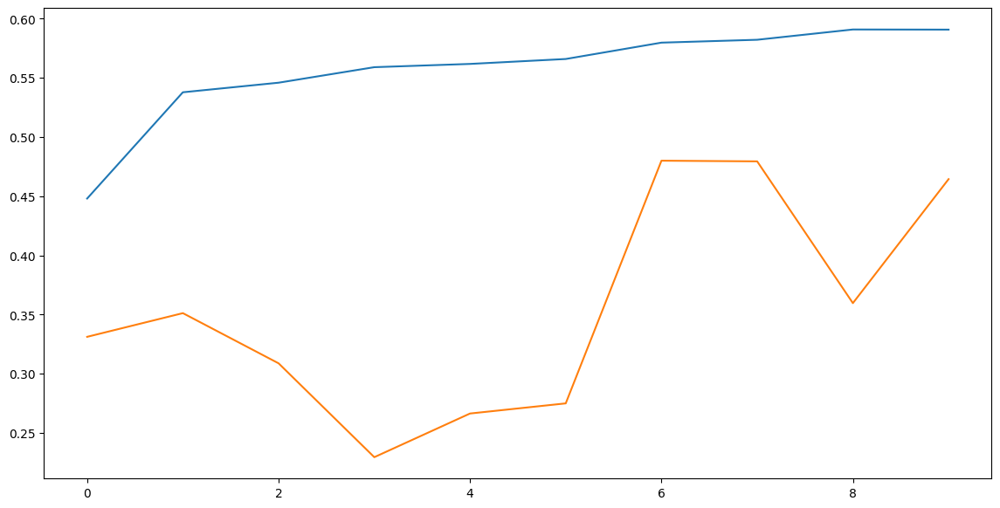

In [ ]:
# Отображение графиков обучения модели

plt.figure(figsize=(14, 7))
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


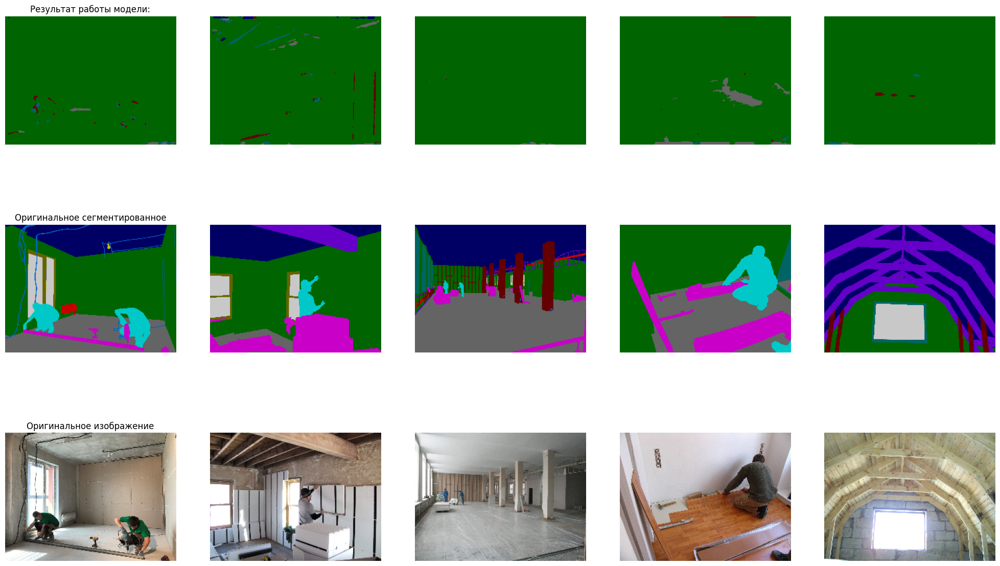

In [ ]:
process_images(model_seq5, 5)

Результат использования функции активации selu не обрадовал. Пожалуй, лучший результат дала функция relu.
Попробуем функцию swish

In [ ]:
# Модель нейронной сети с функцией активации swish

def sequential_segmentation_net(class_count,  # количество классов
                                input_shape   # форма входного изображения
                                ):

    img_input = Input(input_shape)                                              # Создаем входной слой формой input_shape
    x = Conv2D(128, (3, 3), padding='same', name='block1_conv1')(img_input)     # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('swish')(x)

    x = Conv2D(64, (3, 3), padding='same', name='block1_conv3')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('swish')(x)                                                   # Добавляем слой Activation

    x = Conv2D(32, (3, 3), padding='same', name='block1_conv4')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('swish')(x)

    x = Conv2D(16, (3, 3), padding='same', name='block1_conv5')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('swish')(x)

    x = Conv2D(class_count, (3, 3), activation='softmax', padding='same')(x)    # Добавляем Conv2D-Слой с softmax-активацией на class_count-нейронов

    model = Model(img_input, x)                                                 # Создаем модель с входом 'img_input' и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='sparse_categorical_crossentropy',
                  metrics=['sparse_categorical_accuracy'])

    # Возвращаем сформированную модель
    return model

In [ ]:
# Создание модели для измененной функции активации swish

model_seq5 = sequential_segmentation_net(5,
                                        (IMG_WIDTH, IMG_HEIGHT, 3))
model_seq5.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 192, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 192, 256, 128)       │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 192, 256, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 192, 256, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv3 (Conv2D)                │ (None, 192, 256, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 192, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 192, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv4 (Conv2D)                │ (None, 192, 256, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 192, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 192, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv5 (Conv2D)                │ (None, 192, 256, 16)        │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 192, 256, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 192, 256, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 192, 256, 5)         │             725 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 102,149 (399.02 KB)

 Trainable params: 101,669 (397.14 KB)

 Non-trainable params: 480 (1.88 KB)

In [ ]:
# Обучение модели на 10-ти эпохах

history = model_seq5.fit(x_train, y_train5,
                         epochs=10, batch_size=12,
                         validation_data=(x_val, y_val5))

Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 44s 171ms/step - loss: 1.4136 - sparse_categorical_accuracy: 0.4302 - val_loss: 2.2006 - val_sparse_categorical_accuracy: 0.4633
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 1.1712 - sparse_categorical_accuracy: 0.5451 - val_loss: 1.5130 - val_sparse_categorical_accuracy: 0.2660
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 21s 119ms/step - loss: 1.1022 - sparse_categorical_accuracy: 0.5720 - val_loss: 1.6635 - val_sparse_categorical_accuracy: 0.3709
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.0829 - sparse_categorical_accuracy: 0.5795 - val_loss: 1.5535 - val_sparse_categorical_accuracy: 0.4240
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 1.0640 - sparse_categorical_accuracy: 0.5856 - val_loss: 1.7075 - val_sparse_categorical_accuracy: 0.4300
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 20s 123ms/step - loss: 1.0533 - sparse_categorical_accuracy: 0.5922 - val_loss: 2.2019 - val_sparse_categorical_acc

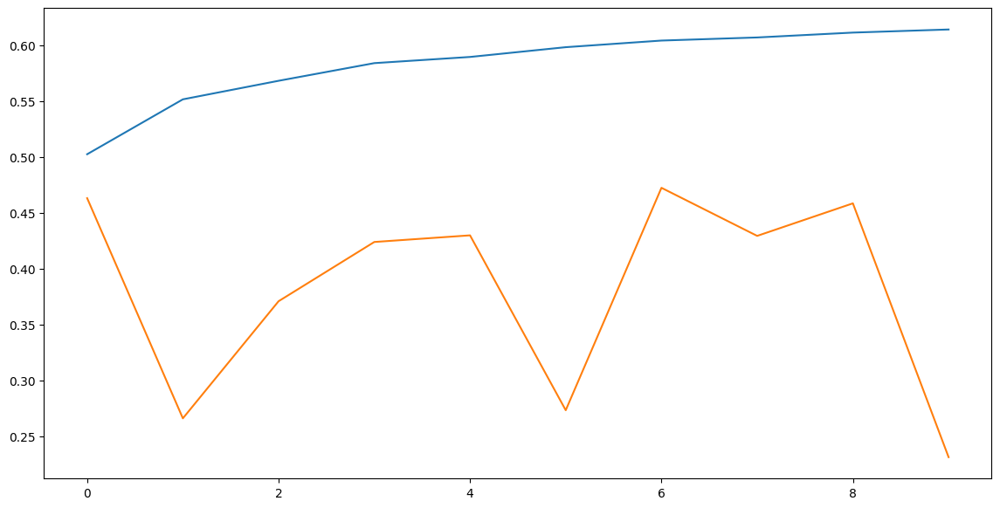

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.show()

In [ ]:
# Функция визуализации процесса сегментации изображений

def process_images(model,        # обученная модель
                   count = 1     # количество случайных картинок для сегментации
                   ):

    # Генерация случайного списка индексов в количестве count между (0, len(x_val)
    indexes = np.random.randint(0, len(x_val), count)

    # Вычисление предсказания сети для картинок с отобранными индексами
    predict = np.argmax(model.predict(x_val[indexes]), axis=-1)

    # Подготовка цветов классов для отрисовки предсказания
    orig = labels_to_rgb(predict[..., None])
    fig, axs = plt.subplots(3, count, figsize=(25, 15))

    # Отрисовка результата работы модели
    for i in range(count):
        # Отображение на графике в первой линии предсказания модели
        axs[0, 0].set_title('Результат работы модели:')
        axs[0, i].imshow(orig[i])
        axs[0, i].axis('off')

        # Отображение на графике во второй линии сегментированного изображения из y_val
        axs[1, 0].set_title('Оригинальное сегментированное')
        axs[1, i].imshow(val_segments[indexes[i]])
        axs[1 ,i].axis('off')

        # Отображение на графике в третьей линии оригинального изображения
        axs[2, 0].set_title('Оригинальное изображение')
        axs[2, i].imshow(val_images[indexes[i]])
        axs[2 ,i].axis('off')

    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


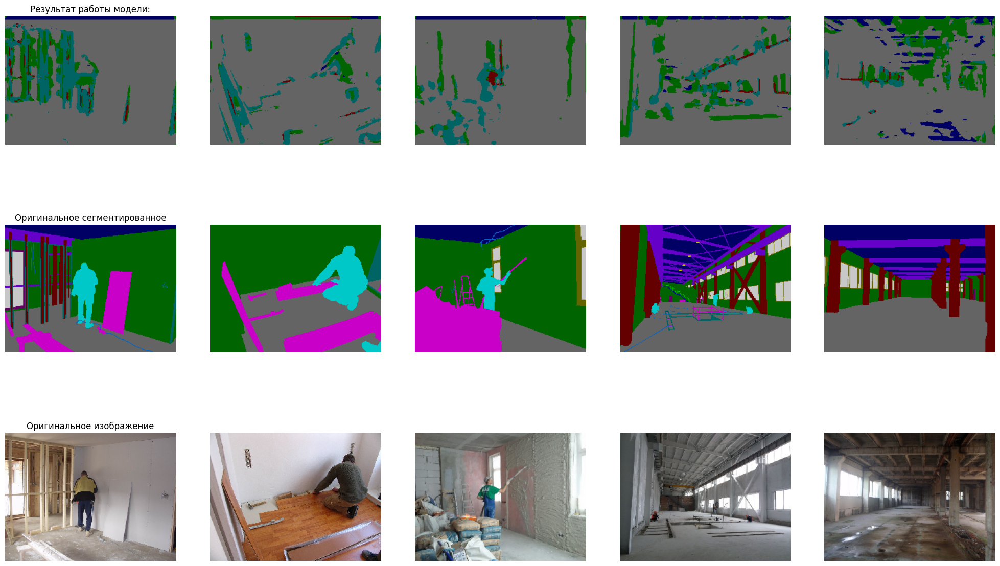

In [ ]:
process_images(model_seq5, 5)

Результат интересный. По графику так себе. Но по изображениям показан другой подход, и результат несколько превосходит две предыдущие попытки. Хотя он, мягко говоря, не идеален.При этом пытается найти людей.

In [20]:
# Модель нейронной сети с функцией активации elu

def sequential_segmentation_net(class_count,  # количество классов
                                input_shape   # форма входного изображения
                                ):

    img_input = Input(input_shape)                                              # Создаем входной слой формой input_shape
    x = Conv2D(128, (3, 3), padding='same', name='block1_conv1')(img_input)     # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('elu')(x)

    x = Conv2D(64, (3, 3), padding='same', name='block1_conv3')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('elu')(x)                                                   # Добавляем слой Activation

    x = Conv2D(32, (3, 3), padding='same', name='block1_conv4')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('elu')(x)

    x = Conv2D(16, (3, 3), padding='same', name='block1_conv5')(x)              # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = Activation('elu')(x)

    x = Conv2D(class_count, (3, 3), activation='softmax', padding='same')(x)    # Добавляем Conv2D-Слой с softmax-активацией на class_count-нейронов

    model = Model(img_input, x)                                                 # Создаем модель с входом 'img_input' и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='sparse_categorical_crossentropy',
                  metrics=['sparse_categorical_accuracy'])

    # Возвращаем сформированную модель
    return model

In [21]:
model_seq5 = sequential_segmentation_net(5,
                                        (IMG_WIDTH, IMG_HEIGHT, 3))
model_seq5.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 192, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 192, 256, 128)       │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 192, 256, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 192, 256, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv3 (Conv2D)                │ (None, 192, 256, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 192, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 192, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv4 (Conv2D)                │ (None, 192, 256, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 192, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 192, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv5 (Conv2D)                │ (None, 192, 256, 16)        │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 192, 256, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 192, 256, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 192, 256, 5)         │             725 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 102,149 (399.02 KB)

 Trainable params: 101,669 (397.14 KB)

 Non-trainable params: 480 (1.88 KB)

In [22]:
# Обучение модели на 10-ти эпохах

history = model_seq5.fit(x_train, y_train5,
                         epochs=10, batch_size=12,
                         validation_data=(x_val, y_val5))

Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 1.3970 - sparse_categorical_accuracy: 0.4444 - val_loss: 1.7527 - val_sparse_categorical_accuracy: 0.4621
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 1.2172 - sparse_categorical_accuracy: 0.5359 - val_loss: 1.5450 - val_sparse_categorical_accuracy: 0.4639
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 21s 118ms/step - loss: 1.1753 - sparse_categorical_accuracy: 0.5460 - val_loss: 1.6957 - val_sparse_categorical_accuracy: 0.4298
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 19s 120ms/step - loss: 1.1393 - sparse_categorical_accuracy: 0.5613 - val_loss: 2.1387 - val_sparse_categorical_accuracy: 0.2627
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 19s 122ms/step - loss: 1.1236 - sparse_categorical_accuracy: 0.5626 - val_loss: 1.6961 - val_sparse_categorical_accuracy: 0.4263
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 1.1023 - sparse_categorical_accuracy: 0.5724 - val_loss: 1.4015 - val_sparse_categorical_acc

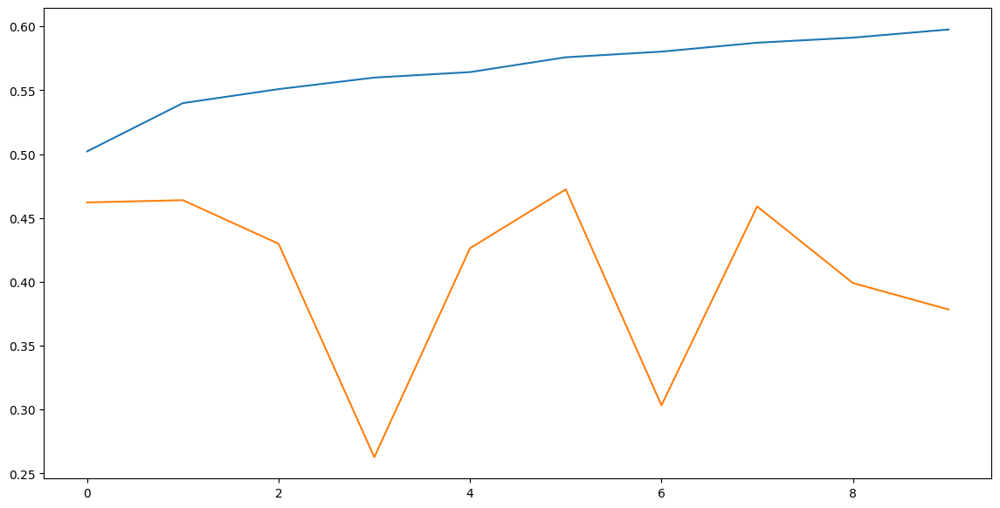

In [23]:
plt.figure(figsize=(14, 7))
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.show()

In [24]:
# Функция визуализации процесса сегментации изображений

def process_images(model,        # обученная модель
                   count = 1     # количество случайных картинок для сегментации
                   ):

    # Генерация случайного списка индексов в количестве count между (0, len(x_val)
    indexes = np.random.randint(0, len(x_val), count)

    # Вычисление предсказания сети для картинок с отобранными индексами
    predict = np.argmax(model.predict(x_val[indexes]), axis=-1)

    # Подготовка цветов классов для отрисовки предсказания
    orig = labels_to_rgb(predict[..., None])
    fig, axs = plt.subplots(3, count, figsize=(25, 15))

    # Отрисовка результата работы модели
    for i in range(count):
        # Отображение на графике в первой линии предсказания модели
        axs[0, 0].set_title('Результат работы модели:')
        axs[0, i].imshow(orig[i])
        axs[0, i].axis('off')

        # Отображение на графике во второй линии сегментированного изображения из y_val
        axs[1, 0].set_title('Оригинальное сегментированное')
        axs[1, i].imshow(val_segments[indexes[i]])
        axs[1 ,i].axis('off')

        # Отображение на графике в третьей линии оригинального изображения
        axs[2, 0].set_title('Оригинальное изображение')
        axs[2, i].imshow(val_images[indexes[i]])
        axs[2 ,i].axis('off')

    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


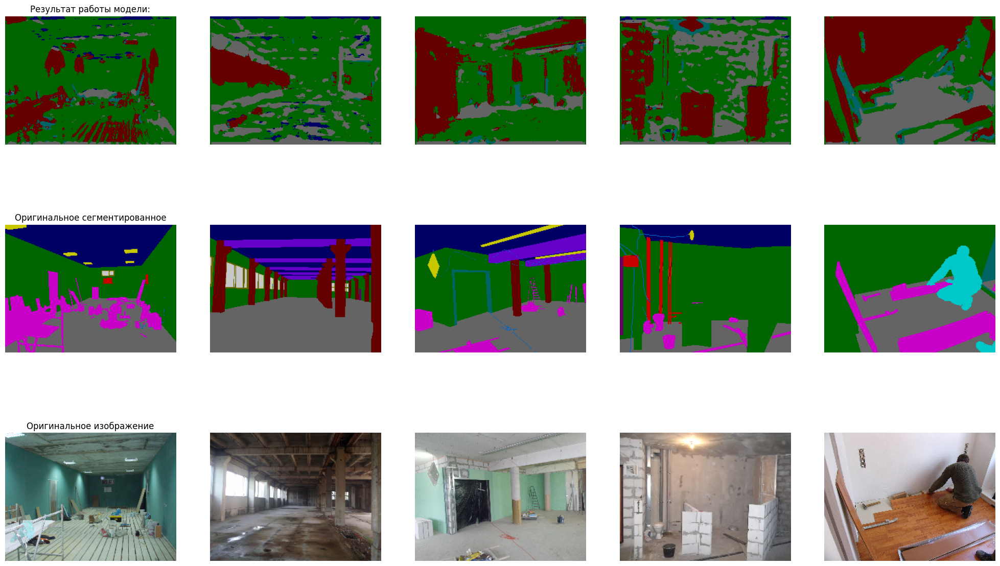

In [25]:
process_images(model_seq5, 5)

Нейросеть с функцией активации elu показала неплохой результат.
Для нормальной проверки необходимо больше времени и большая база для исследований.

In [28]:
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, LeakyReLU

def sequential_segmentation_net(class_count,  # количество классов
                                input_shape   # форма входного изображения
                                ):

    img_input = Input(input_shape)                                              # Создаем входной слой формой input_shape
    x = Conv2D(128, (3, 3), padding='same', name='block1_conv1')(img_input)     # Добавляем Conv2D-слой с 128-нейронами
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = LeakyReLU(alpha=0.01)(x)                                                  # Используем слой LeakyReLU

    x = Conv2D(64, (3, 3), padding='same', name='block1_conv2')(x)              # Исправлено имя блока для ясности
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = LeakyReLU(alpha=0.01)(x)                                                  # Используем слой LeakyReLU

    x = Conv2D(32, (3, 3), padding='same', name='block1_conv3')(x)              # Исправлено имя блока для ясности
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = LeakyReLU(alpha=0.01)(x)                                                  # Используем слой LeakyReLU

    x = Conv2D(16, (3, 3), padding='same', name='block1_conv4')(x)              # Исправлено имя блока для ясности
    x = BatchNormalization()(x)                                                 # Добавляем слой BatchNormalization
    x = LeakyReLU(alpha=0.01)(x)                                                  # Используем слой LeakyReLU

    x = Conv2D(class_count, (3, 3), padding='same')(x)                          # Убираем активацию в этом слое

    # Применяем softmax активацию для многоклассовой сегментации
    x = Conv2D(class_count, (3, 3), activation='softmax', padding='same')(x)    # Используем softmax для многоклассов

    model = Model(img_input, x)                                                 # Создаем модель с входом 'img_input' и выходом 'x'

    # Компилируем модель
    model.compile(optimizer=Adam(learning_rate=1e-3),
                  loss='sparse_categorical_crossentropy',
                  metrics=['sparse_categorical_accuracy'])

    # Возвращаем сформированную модель
    return model

In [29]:
model_seq5 = sequential_segmentation_net(5,
                                        (IMG_WIDTH, IMG_HEIGHT, 3))
model_seq5.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 192, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 192, 256, 128)       │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 192, 256, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 192, 256, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 192, 256, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 192, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 192, 256, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv3 (Conv2D)                │ (None, 192, 256, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 192, 256, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 192, 256, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv4 (Conv2D)                │ (None, 192, 256, 16)        │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 192, 256, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 192, 256, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 192, 256, 5)         │             725 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 192, 256, 5)         │             230 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 102,379 (399.92 KB)

 Trainable params: 101,899 (398.04 KB)

 Non-trainable params: 480 (1.88 KB)

In [30]:
# Обучение модели на 10-ти эпохах

history = model_seq5.fit(x_train, y_train5,
                         epochs=10, batch_size=12,
                         validation_data=(x_val, y_val5))

Epoch 1/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 32s 147ms/step - loss: 1.2988 - sparse_categorical_accuracy: 0.5063 - val_loss: 1.5682 - val_sparse_categorical_accuracy: 0.4262
Epoch 2/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 32s 119ms/step - loss: 1.1476 - sparse_categorical_accuracy: 0.5598 - val_loss: 1.6041 - val_sparse_categorical_accuracy: 0.2983
Epoch 3/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 1.0936 - sparse_categorical_accuracy: 0.5776 - val_loss: 1.3563 - val_sparse_categorical_accuracy: 0.4574
Epoch 4/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 21s 122ms/step - loss: 1.0611 - sparse_categorical_accuracy: 0.5906 - val_loss: 1.3865 - val_sparse_categorical_accuracy: 0.4641
Epoch 5/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - loss: 1.0199 - sparse_categorical_accuracy: 0.6101 - val_loss: 1.6038 - val_sparse_categorical_accuracy: 0.3195
Epoch 6/10
159/159 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - loss: 0.9970 - sparse_categorical_accuracy: 0.6242 - val_loss: 1.4666 - val_sparse_categorical_acc

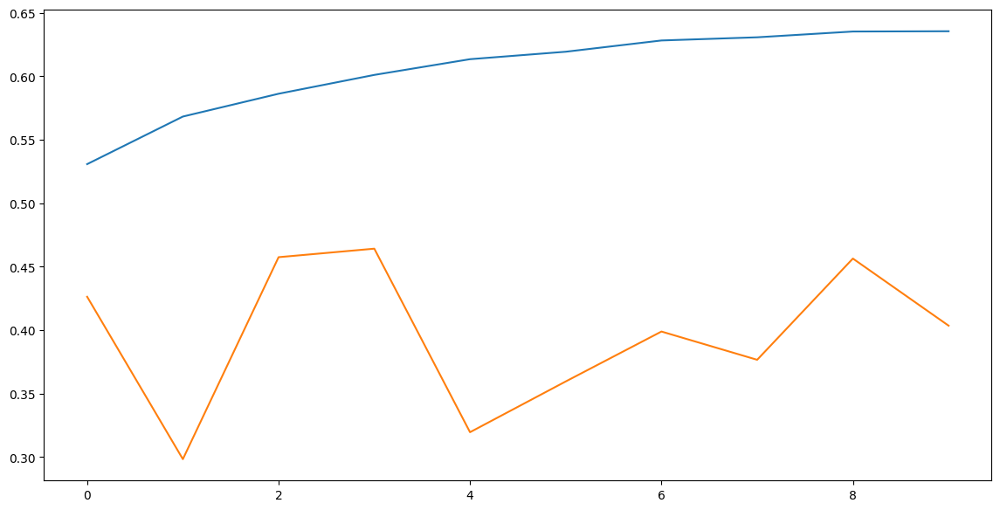

In [31]:
plt.figure(figsize=(14, 7))
plt.plot(history.history['sparse_categorical_accuracy'])
plt.plot(history.history['val_sparse_categorical_accuracy'])
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step


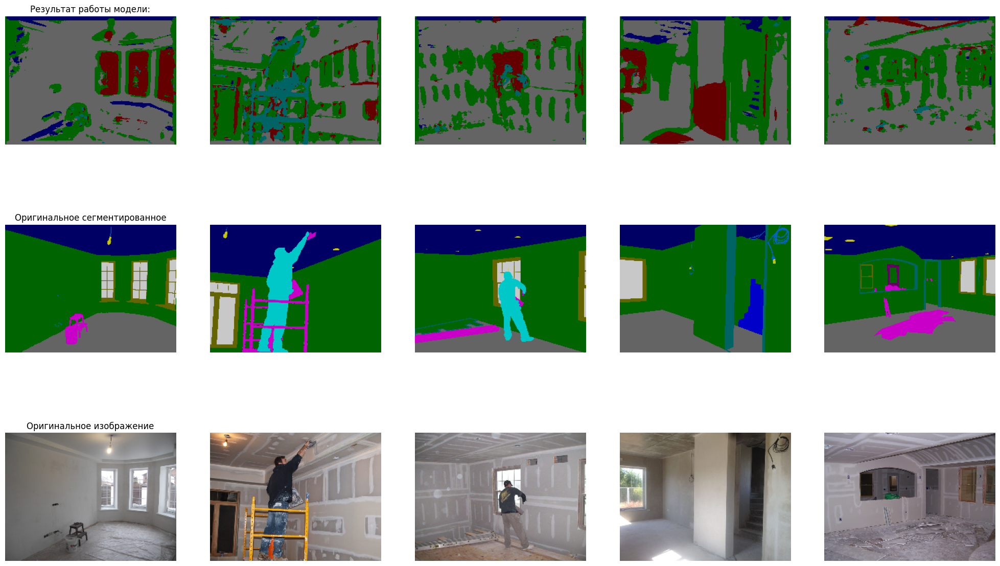

In [32]:
process_images(model_seq5, 5)

Функция Leaky ReLU показала, пожалуй, наилучший результат. К сожалению база невелика и количество эпох ограничено, в связи с нехваткой ресурсов.